# Project: Wrangling and Analyze Data

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.
1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [2]:
import glob
import pandas as pd
import json
import numpy as np
import re
import copy

In [3]:
df_tweet_info = pd.read_csv('twitter-archive-enhanced.csv')

In [4]:
df_tweet_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [5]:
import requests
import pandas as pd

In [6]:
predicted_breeds_url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(predicted_breeds_url)
with open('image_predictions.tsv', 'wb') as f:
    f.write(response.content)
# Import predicted breeds file
df_img_predict = pd.read_csv("image_predictions.tsv", sep='\t')

In [7]:
df_img_predict.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

In [8]:
import glob
import pandas as pd
import json
import numpy as np

In [9]:
# list comprehension
# each json is a line, read the file line by line
#data = [json.loads(line) for line in open('tweet_json.txt', 'r')]
df_additional_tweet = pd.DataFrame(columns=['tweet_id', 'retweet_count', 'favorite_count','retweeted','favorited','created_at'])
with open('tweet_json.txt', 'r') as json_file:
    for line in json_file:
        json_data = json.loads(line)
        tweet_id = json_data['id_str']
        retweet_count = json_data['retweet_count']
        favorite_count = json_data['favorite_count']
        retweeted = json_data['retweeted']
        favorited = json_data['favorited']
        created_at = json_data['created_at']
        print(json.dumps(json_data, indent=2))
        df_additional_tweet = df_additional_tweet.append(pd.DataFrame([[tweet_id, retweet_count, favorite_count,retweeted,favorited,created_at]],columns=['tweet_id','retweet_count','favorite_count','retweeted','favorited','created_at']))
df_additional_tweet = df_additional_tweet.reset_index(drop=True)

{
  "created_at": "Tue Aug 01 16:23:56 +0000 2017",
  "id": 892420643555336193,
  "id_str": "892420643555336193",
  "full_text": "This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU",
  "truncated": false,
  "display_text_range": [
    0,
    85
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 892420639486877696,
        "id_str": "892420639486877696",
        "indices": [
          86,
          109
        ],
        "media_url": "http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg",
        "media_url_https": "https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg",
        "url": "https://t.co/MgUWQ76dJU",
        "display_url": "pic.twitter.com/MgUWQ76dJU",
        "expanded_url": "https://twitter.com/dog_rates/status/892420643555336193/photo/1",
        "type": "photo",
        "sizes": {
          "large": {
            "w": 540,
            "h":

{
  "created_at": "Thu Jul 06 00:46:41 +0000 2017",
  "id": 882762694511734784,
  "id_str": "882762694511734784",
  "full_text": "This is Gus. He's quite the cheeky pupper. Already perfected the disinterested wink. 12/10 would let steal my girl https://t.co/D43I96SlVu",
  "truncated": false,
  "display_text_range": [
    0,
    114
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 882762686299353088,
        "id_str": "882762686299353088",
        "indices": [
          115,
          138
        ],
        "media_url": "http://pbs.twimg.com/media/DEAz_HHXsAA-p_z.jpg",
        "media_url_https": "https://pbs.twimg.com/media/DEAz_HHXsAA-p_z.jpg",
        "url": "https://t.co/D43I96SlVu",
        "display_url": "pic.twitter.com/D43I96SlVu",
        "expanded_url": "https://twitter.com/dog_rates/status/882762694511734784/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
       

}
{
  "created_at": "Sun Jun 11 21:18:31 +0000 2017",
  "id": 874012996292530176,
  "id_str": "874012996292530176",
  "full_text": "This is Sebastian. He can't see all the colors of the rainbow, but he can see that this flag makes his human happy. 13/10 #PrideMonth puppo https://t.co/XBE0evJZ6V",
  "truncated": false,
  "display_text_range": [
    0,
    139
  ],
  "entities": {
    "hashtags": [
      {
        "text": "PrideMonth",
        "indices": [
          122,
          133
        ]
      }
    ],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 874012990328197120,
        "id_str": "874012990328197120",
        "indices": [
          140,
          163
        ],
        "media_url": "http://pbs.twimg.com/media/DCEeLxmW0AAHXNk.jpg",
        "media_url_https": "https://pbs.twimg.com/media/DCEeLxmW0AAHXNk.jpg",
        "url": "https://t.co/XBE0evJZ6V",
        "display_url": "pic.twitter.com/XBE0evJZ6V",
        "expanded_url": "

{
  "created_at": "Thu May 18 00:50:50 +0000 2017",
  "id": 865006731092295680,
  "id_str": "865006731092295680",
  "full_text": "This is Nelly. He really hopes you like his Hawaiian shirt. He already tore the tags off. 13/10 h*ck of a puppurchase https://t.co/LbkG5CiM7o",
  "truncated": false,
  "display_text_range": [
    0,
    117
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 865006724092010496,
        "id_str": "865006724092010496",
        "indices": [
          118,
          141
        ],
        "media_url": "http://pbs.twimg.com/media/DAEfCFXUIAA1uqj.jpg",
        "media_url_https": "https://pbs.twimg.com/media/DAEfCFXUIAA1uqj.jpg",
        "url": "https://t.co/LbkG5CiM7o",
        "display_url": "pic.twitter.com/LbkG5CiM7o",
        "expanded_url": "https://twitter.com/dog_rates/status/865006731092295680/photo/1",
        "type": "photo",
        "sizes": {
          "large": {
    

{
  "created_at": "Mon Apr 24 15:13:52 +0000 2017",
  "id": 856526610513747968,
  "id_str": "856526610513747968",
  "full_text": "THIS IS CHARLIE, MARK. HE DID JUST WANT TO SAY HI AFTER ALL. PUPGRADED TO A 14/10. WOULD BE AN HONOR TO FLY WITH https://t.co/p1hBHCmWnA",
  "truncated": false,
  "display_text_range": [
    0,
    112
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 856526604033556482,
        "id_str": "856526604033556482",
        "indices": [
          113,
          136
        ],
        "media_url": "http://pbs.twimg.com/media/C-L-aIYXgAIR0jY.jpg",
        "media_url_https": "https://pbs.twimg.com/media/C-L-aIYXgAIR0jY.jpg",
        "url": "https://t.co/p1hBHCmWnA",
        "display_url": "pic.twitter.com/p1hBHCmWnA",
        "expanded_url": "https://twitter.com/dog_rates/status/856526610513747968/photo/1",
        "type": "photo",
        "sizes": {
          "large": {
         

{
  "created_at": "Sat Apr 01 00:04:17 +0000 2017",
  "id": 847962785489326080,
  "id_str": "847962785489326080",
  "full_text": "This is Georgie. He's very shy. Only puppears when called. Aggressively average at fetch. Unique front paws. Looks slippery. 10/10 would pet https://t.co/rcDs5LkiSj",
  "truncated": false,
  "display_text_range": [
    0,
    140
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 847962765348052992,
        "id_str": "847962765348052992",
        "indices": [
          141,
          164
        ],
        "media_url": "http://pbs.twimg.com/media/C8SRpHNUIAARB3j.jpg",
        "media_url_https": "https://pbs.twimg.com/media/C8SRpHNUIAARB3j.jpg",
        "url": "https://t.co/rcDs5LkiSj",
        "display_url": "pic.twitter.com/rcDs5LkiSj",
        "expanded_url": "https://twitter.com/dog_rates/status/847962785489326080/photo/1",
        "type": "photo",
        "sizes": {
  

{
  "created_at": "Tue Mar 07 22:22:32 +0000 2017",
  "id": 839239871831150596,
  "id_str": "839239871831150596",
  "full_text": "This is Odie. He's big. 13/10 would attempt to ride https://t.co/JEXB9RwBmm",
  "truncated": false,
  "display_text_range": [
    0,
    51
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 839239862192648194,
        "id_str": "839239862192648194",
        "indices": [
          52,
          75
        ],
        "media_url": "http://pbs.twimg.com/media/C6WUNUtXMAIIk1y.jpg",
        "media_url_https": "https://pbs.twimg.com/media/C6WUNUtXMAIIk1y.jpg",
        "url": "https://t.co/JEXB9RwBmm",
        "display_url": "pic.twitter.com/JEXB9RwBmm",
        "expanded_url": "https://twitter.com/dog_rates/status/839239871831150596/photo/1",
        "type": "photo",
        "sizes": {
          "medium": {
            "w": 675,
            "h": 1200,
            "resize": "fit"

{
  "created_at": "Mon Feb 20 17:37:34 +0000 2017",
  "id": 833732339549220864,
  "id_str": "833732339549220864",
  "full_text": "RT @rolltidered: This is Gabby. Now requests to be referred to as a guide dog, thanks to @dog_rates and @ShopWeRateDogs. 12/10 in my book.\u2026",
  "truncated": false,
  "display_text_range": [
    0,
    139
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [
      {
        "screen_name": "rolltidered",
        "name": "Ellen M",
        "id": 44667502,
        "id_str": "44667502",
        "indices": [
          3,
          15
        ]
      },
      {
        "screen_name": "dog_rates",
        "name": "WeRateDogs\u2122 (author)",
        "id": 4196983835,
        "id_str": "4196983835",
        "indices": [
          89,
          99
        ]
      },
      {
        "screen_name": "ShopWeRateDogs",
        "name": "The Dog Rates Shop",
        "id": 752178371354882049,
        "id_str": "752178371354882049",
        "

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{
  "created_at": "Sun Sep 25 00:06:08 +0000 2016",
  "id": 779834332596887552,
  "id_str": "779834332596887552",
  "full_text": "This is Scout. He really wants to kiss himself. H*ckin inappropriate. 11/10 narcissistic af https://t.co/x0gV2Ck3AD",
  "truncated": false,
  "display_text_range": [
    0,
    91
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 779834320894713856,
        "id_str": "779834320894713856",
        "indices": [
          92,
          115
        ],
        "media_url": "http://pbs.twimg.com/media/CtKHLuCWYAA2TTs.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CtKHLuCWYAA2TTs.jpg",
        "url": "https://t.co/x0gV2Ck3AD",
        "display_url": "pic.twitter.com/x0gV2Ck3AD",
        "expanded_url": "https://twitter.com/dog_rates/status/779834332596887552/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
            "w": 513,
          

}
{
  "created_at": "Wed Sep 07 15:44:53 +0000 2016",
  "id": 773547596996571136,
  "id_str": "773547596996571136",
  "full_text": "This is Chelsea. She forgot how to dog. 11/10 get it together pupper https://t.co/nBJ5RE4yHb",
  "truncated": false,
  "display_text_range": [
    0,
    68
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 773547591439122432,
        "id_str": "773547591439122432",
        "indices": [
          69,
          92
        ],
        "media_url": "http://pbs.twimg.com/media/Crwxb5yWgAAX5P_.jpg",
        "media_url_https": "https://pbs.twimg.com/media/Crwxb5yWgAAX5P_.jpg",
        "url": "https://t.co/nBJ5RE4yHb",
        "display_url": "pic.twitter.com/nBJ5RE4yHb",
        "expanded_url": "https://twitter.com/dog_rates/status/773547596996571136/photo/1",
        "type": "photo",
        "sizes": {
          "large": {
            "w": 768,
            "h": 1024,
         

{
  "created_at": "Sun Aug 21 23:15:55 +0000 2016",
  "id": 767500508068192258,
  "id_str": "767500508068192258",
  "full_text": "This is Louie. He's making quite a h*ckin mess. Doesn't seem to care. 12/10 jubilant af https://t.co/Z2g2YWPzX2",
  "truncated": false,
  "display_text_range": [
    0,
    87
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 767500493799231488,
        "id_str": "767500493799231488",
        "indices": [
          88,
          111
        ],
        "media_url": "http://pbs.twimg.com/media/Cqa1ofnXEAAG0yn.jpg",
        "media_url_https": "https://pbs.twimg.com/media/Cqa1ofnXEAAG0yn.jpg",
        "url": "https://t.co/Z2g2YWPzX2",
        "display_url": "pic.twitter.com/Z2g2YWPzX2",
        "expanded_url": "https://twitter.com/dog_rates/status/767500508068192258/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
            "w": 543,
            "h

{
  "created_at": "Tue Aug 02 01:44:48 +0000 2016",
  "id": 760290219849637889,
  "id_str": "760290219849637889",
  "full_text": "This is Rocco. He's doing his best. 13/10 someone help him (IG: rocco_roni) https://t.co/qFsl1nnXMv",
  "truncated": false,
  "display_text_range": [
    0,
    75
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 760289324994879489,
        "id_str": "760289324994879489",
        "indices": [
          76,
          99
        ],
        "media_url": "http://pbs.twimg.com/ext_tw_video_thumb/760289324994879489/pu/img/3ItvBEoo4aebPfvr.jpg",
        "media_url_https": "https://pbs.twimg.com/ext_tw_video_thumb/760289324994879489/pu/img/3ItvBEoo4aebPfvr.jpg",
        "url": "https://t.co/qFsl1nnXMv",
        "display_url": "pic.twitter.com/qFsl1nnXMv",
        "expanded_url": "https://twitter.com/dog_rates/status/760290219849637889/video/1",
        "type": "photo",
        "

{
  "created_at": "Mon Jul 18 03:06:01 +0000 2016",
  "id": 754874841593970688,
  "id_str": "754874841593970688",
  "full_text": "RT @dog_rates: This is Rubio. He has too much skin. 11/10 https://t.co/NLOHmlENag",
  "truncated": false,
  "display_text_range": [
    0,
    81
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [
      {
        "screen_name": "dog_rates",
        "name": "WeRateDogs\u2122 (author)",
        "id": 4196983835,
        "id_str": "4196983835",
        "indices": [
          3,
          13
        ]
      }
    ],
    "urls": [],
    "media": [
      {
        "id": 679158360810352640,
        "id_str": "679158360810352640",
        "indices": [
          58,
          81
        ],
        "media_url": "http://pbs.twimg.com/media/CWza7kpWcAAdYLc.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CWza7kpWcAAdYLc.jpg",
        "url": "https://t.co/NLOHmlENag",
        "display_url": "pic.twitter.com/NLOHmlENag",
      

{
  "created_at": "Tue Jul 05 00:00:18 +0000 2016",
  "id": 750117059602808832,
  "id_str": "750117059602808832",
  "full_text": "This is Calvin. He just loves America so much. 10/10 would roll around in flag with https://t.co/RXdzWaCQHm",
  "truncated": false,
  "display_text_range": [
    0,
    83
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 750117017039011840,
        "id_str": "750117017039011840",
        "indices": [
          84,
          107
        ],
        "media_url": "http://pbs.twimg.com/media/Cmjzc-SWAAAPgUJ.jpg",
        "media_url_https": "https://pbs.twimg.com/media/Cmjzc-SWAAAPgUJ.jpg",
        "url": "https://t.co/RXdzWaCQHm",
        "display_url": "pic.twitter.com/RXdzWaCQHm",
        "expanded_url": "https://twitter.com/dog_rates/status/750117059602808832/photo/1",
        "type": "photo",
        "sizes": {
          "medium": {
            "w": 900,
            "h": 

{
  "created_at": "Sun Jun 26 23:05:29 +0000 2016",
  "id": 747204161125646336,
  "id_str": "747204161125646336",
  "full_text": "This is Clark. He's deadly af. Clearly part shark (see pic 2). 10/10 would totally still try to pet https://t.co/dmdEBOEctC",
  "truncated": false,
  "display_text_range": [
    0,
    99
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 747204153907253248,
        "id_str": "747204153907253248",
        "indices": [
          100,
          123
        ],
        "media_url": "http://pbs.twimg.com/media/Cl6aOBhWkAAglPJ.jpg",
        "media_url_https": "https://pbs.twimg.com/media/Cl6aOBhWkAAglPJ.jpg",
        "url": "https://t.co/dmdEBOEctC",
        "display_url": "pic.twitter.com/dmdEBOEctC",
        "expanded_url": "https://twitter.com/dog_rates/status/747204161125646336/photo/1",
        "type": "photo",
        "sizes": {
          "thumb": {
            "w": 150,
 

{
  "created_at": "Sat Jun 11 21:27:17 +0000 2016",
  "id": 741743634094141440,
  "id_str": "741743634094141440",
  "full_text": "Meet Aqua. She's a sandy pupper. Not sure how she feels about being so sandy. Radical tongue slip. 11/10 petable af https://t.co/rYxJ0UQtbE",
  "truncated": false,
  "display_text_range": [
    0,
    115
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 741743615312056320,
        "id_str": "741743615312056320",
        "indices": [
          116,
          139
        ],
        "media_url": "http://pbs.twimg.com/media/Cksz42EW0AAh2NF.jpg",
        "media_url_https": "https://pbs.twimg.com/media/Cksz42EW0AAh2NF.jpg",
        "url": "https://t.co/rYxJ0UQtbE",
        "display_url": "pic.twitter.com/rYxJ0UQtbE",
        "expanded_url": "https://twitter.com/dog_rates/status/741743634094141440/photo/1",
        "type": "photo",
        "sizes": {
          "medium": {
     

{
  "created_at": "Tue May 24 15:55:00 +0000 2016",
  "id": 735137028879360001,
  "id_str": "735137028879360001",
  "full_text": "Meet Buckley. His family &amp; some neighbors came over to watch him perform but he's nervous af. 9/10 u got this pupper https://t.co/5bdCpPlno9",
  "truncated": false,
  "display_text_range": [
    0,
    120
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 735137021832888320,
        "id_str": "735137021832888320",
        "indices": [
          121,
          144
        ],
        "media_url": "http://pbs.twimg.com/media/CjO7OfeWgAAUQy-.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CjO7OfeWgAAUQy-.jpg",
        "url": "https://t.co/5bdCpPlno9",
        "display_url": "pic.twitter.com/5bdCpPlno9",
        "expanded_url": "https://twitter.com/dog_rates/status/735137028879360001/photo/1",
        "type": "photo",
        "sizes": {
          "thumb": {
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{
  "created_at": "Thu Feb 11 20:34:41 +0000 2016",
  "id": 697881462549430272,
  "id_str": "697881462549430272",
  "full_text": "This is Carter. He wakes up in the morning and pisses excellence. 10/10 best there is plain and simple https://t.co/pHktDjpFr8",
  "truncated": false,
  "display_text_range": [
    0,
    126
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 697881447554613248,
        "id_str": "697881447554613248",
        "indices": [
          103,
          126
        ],
        "media_url": "http://pbs.twimg.com/media/Ca9feqDUAAA_z7T.jpg",
        "media_url_https": "https://pbs.twimg.com/media/Ca9feqDUAAA_z7T.jpg",
        "url": "https://t.co/pHktDjpFr8",
        "display_url": "pic.twitter.com/pHktDjpFr8",
        "expanded_url": "https://twitter.com/dog_rates/status/697881462549430272/photo/1",
        "type": "photo",
        "sizes": {
          "large": {
            "w": 10

{
  "created_at": "Mon Feb 01 15:39:48 +0000 2016",
  "id": 694183373896572928,
  "id_str": "694183373896572928",
  "full_text": "This is Lola. She realized mid hug that she's not ready for a committed relationship with a teddy bear. 9/10 https://t.co/pVebzwRioD",
  "truncated": false,
  "display_text_range": [
    0,
    132
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 694183359854018562,
        "id_str": "694183359854018562",
        "indices": [
          109,
          132
        ],
        "media_url": "http://pbs.twimg.com/media/CaI8Fn0WAAIrFJN.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CaI8Fn0WAAIrFJN.jpg",
        "url": "https://t.co/pVebzwRioD",
        "display_url": "pic.twitter.com/pVebzwRioD",
        "expanded_url": "https://twitter.com/dog_rates/status/694183373896572928/photo/1",
        "type": "photo",
        "sizes": {
          "thumb": {
            "

{
  "created_at": "Sun Jan 24 03:14:07 +0000 2016",
  "id": 691096613310316544,
  "id_str": "691096613310316544",
  "full_text": "Here we see one dog giving a puptalk to another dog. Both are focused af. Left one has powerful feet. 11/10 for both https://t.co/fUacc13OrW",
  "truncated": false,
  "display_text_range": [
    0,
    140
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 691096572814176256,
        "id_str": "691096572814176256",
        "indices": [
          117,
          140
        ],
        "media_url": "http://pbs.twimg.com/media/CZdEq-AUMAAWayR.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CZdEq-AUMAAWayR.jpg",
        "url": "https://t.co/fUacc13OrW",
        "display_url": "pic.twitter.com/fUacc13OrW",
        "expanded_url": "https://twitter.com/dog_rates/status/691096613310316544/photo/1",
        "type": "photo",
        "sizes": {
          "thumb": {
     

{
  "created_at": "Sun Jan 17 21:01:41 +0000 2016",
  "id": 688828561667567616,
  "id_str": "688828561667567616",
  "full_text": "Say hello to Brad. His car probably has a spoiler. Tan year round. Likes your insta pic but doesn't text back. 9/10 https://t.co/dfCCK3tWfr",
  "truncated": false,
  "display_text_range": [
    0,
    139
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 688828550535901190,
        "id_str": "688828550535901190",
        "indices": [
          116,
          139
        ],
        "media_url": "http://pbs.twimg.com/media/CY816snW8AYltrQ.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CY816snW8AYltrQ.jpg",
        "url": "https://t.co/dfCCK3tWfr",
        "display_url": "pic.twitter.com/dfCCK3tWfr",
        "expanded_url": "https://twitter.com/dog_rates/status/688828561667567616/photo/1",
        "type": "photo",
        "sizes": {
          "thumb": {
      

{
  "created_at": "Sun Jan 10 02:13:27 +0000 2016",
  "id": 686007916130873345,
  "id_str": "686007916130873345",
  "full_text": "This pupper has a magical eye. 11/10 I can't stop looking at it https://t.co/heAGpKTpPW",
  "truncated": false,
  "display_text_range": [
    0,
    87
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 686007910048989185,
        "id_str": "686007910048989185",
        "indices": [
          64,
          87
        ],
        "media_url": "http://pbs.twimg.com/media/CYUwjz-UAAEcdi8.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CYUwjz-UAAEcdi8.jpg",
        "url": "https://t.co/heAGpKTpPW",
        "display_url": "pic.twitter.com/heAGpKTpPW",
        "expanded_url": "https://twitter.com/dog_rates/status/686007916130873345/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
            "w": 340,
            "h": 453,
            "resi

{
  "created_at": "Mon Jan 04 03:50:08 +0000 2016",
  "id": 683857920510050305,
  "id_str": "683857920510050305",
  "full_text": "Meet Sadie. She fell asleep on the beach and her friends buried her. 10/10 can't trust fellow puppers these days https://t.co/LoKVvc1xAW",
  "truncated": false,
  "display_text_range": [
    0,
    136
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 683857914461839360,
        "id_str": "683857914461839360",
        "indices": [
          113,
          136
        ],
        "media_url": "http://pbs.twimg.com/media/CX2NJmRWYAAxz_5.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CX2NJmRWYAAxz_5.jpg",
        "url": "https://t.co/LoKVvc1xAW",
        "display_url": "pic.twitter.com/LoKVvc1xAW",
        "expanded_url": "https://twitter.com/dog_rates/status/683857920510050305/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
         

{
  "created_at": "Tue Dec 29 04:31:49 +0000 2015",
  "id": 681694085539872773,
  "id_str": "681694085539872773",
  "full_text": "This is Bo. He's a Benedoop Cumbersnatch. Seems frustrated with own feet. Portable as hell. 11/10 very solid pupper https://t.co/TONMhRoQh7",
  "truncated": false,
  "display_text_range": [
    0,
    139
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 681694081152516096,
        "id_str": "681694081152516096",
        "indices": [
          116,
          139
        ],
        "media_url": "http://pbs.twimg.com/media/CXXdJ7CVAAALu23.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CXXdJ7CVAAALu23.jpg",
        "url": "https://t.co/TONMhRoQh7",
        "display_url": "pic.twitter.com/TONMhRoQh7",
        "expanded_url": "https://twitter.com/dog_rates/status/681694085539872773/photo/1",
        "type": "photo",
        "sizes": {
          "medium": {
     

{
  "created_at": "Thu Dec 24 19:00:23 +0000 2015",
  "id": 680100725817409536,
  "id_str": "680100725817409536",
  "full_text": "This pupper is not coming inside until she catches a snowflake on her tongue. 11/10 the determination is palpable https://t.co/lvMYbmKq8H",
  "truncated": false,
  "display_text_range": [
    0,
    137
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 679944180743954432,
        "id_str": "679944180743954432",
        "indices": [
          114,
          137
        ],
        "media_url": "http://pbs.twimg.com/media/CW-loUBWYAAn2Cb.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CW-loUBWYAAn2Cb.jpg",
        "url": "https://t.co/lvMYbmKq8H",
        "display_url": "pic.twitter.com/lvMYbmKq8H",
        "expanded_url": "https://twitter.com/dog_rates/status/680100725817409536/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
        

}
{
  "created_at": "Sun Dec 20 01:03:46 +0000 2015",
  "id": 678380236862578688,
  "id_str": "678380236862578688",
  "full_text": "This is Crumpet. He underestimated the snow. Quickly retreating. 10/10 https://t.co/a0Zx5LDFZa",
  "truncated": false,
  "display_text_range": [
    0,
    94
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 678380231556595712,
        "id_str": "678380231556595712",
        "indices": [
          71,
          94
        ],
        "media_url": "http://pbs.twimg.com/media/CWoXOfSUAAA4u8g.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CWoXOfSUAAA4u8g.jpg",
        "url": "https://t.co/a0Zx5LDFZa",
        "display_url": "pic.twitter.com/a0Zx5LDFZa",
        "expanded_url": "https://twitter.com/dog_rates/status/678380236862578688/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
            "w": 340,
            "h": 453,
        

{
  "created_at": "Tue Dec 15 17:11:09 +0000 2015",
  "id": 676811746707918848,
  "id_str": "676811746707918848",
  "full_text": "Say hello to Penny &amp; Gizmo. They are practicing their caroling. The ambition in the room is tangible. 9/10 for both https://t.co/aqBHjjh5VD",
  "truncated": false,
  "display_text_range": [
    0,
    143
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 676811739476967424,
        "id_str": "676811739476967424",
        "indices": [
          120,
          143
        ],
        "media_url": "http://pbs.twimg.com/media/CWSEsO9WwAAX-fZ.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CWSEsO9WwAAX-fZ.jpg",
        "url": "https://t.co/aqBHjjh5VD",
        "display_url": "pic.twitter.com/aqBHjjh5VD",
        "expanded_url": "https://twitter.com/dog_rates/status/676811746707918848/photo/1",
        "type": "photo",
        "sizes": {
          "large": {
  

{
  "created_at": "Sat Dec 12 04:23:49 +0000 2015",
  "id": 675531475945709568,
  "id_str": "675531475945709568",
  "full_text": "This is Ellie AKA Queen Slayer of the Orbs. Very self-motivated. Great yard. Rad foliage. 10/10 would pet diligently https://t.co/c9jmg3Xtzn",
  "truncated": false,
  "display_text_range": [
    0,
    140
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 675531466269286400,
        "id_str": "675531466269286400",
        "indices": [
          117,
          140
        ],
        "media_url": "http://pbs.twimg.com/media/CV_4ShmUYAA3wNu.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CV_4ShmUYAA3wNu.jpg",
        "url": "https://t.co/c9jmg3Xtzn",
        "display_url": "pic.twitter.com/c9jmg3Xtzn",
        "expanded_url": "https://twitter.com/dog_rates/status/675531475945709568/photo/1",
        "type": "photo",
        "sizes": {
          "large": {
     

{
  "created_at": "Wed Dec 09 23:58:35 +0000 2015",
  "id": 674739953134403584,
  "id_str": "674739953134403584",
  "full_text": "\"\ud83c\udfb6 DO YOU BELIEVE IN LIFE AFTER LOVE \ud83c\udfb6\"\n11/10 https://t.co/URNs5zFskc",
  "truncated": false,
  "display_text_range": [
    0,
    69
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 674739948218671104,
        "id_str": "674739948218671104",
        "indices": [
          46,
          69
        ],
        "media_url": "http://pbs.twimg.com/media/CV0oaHFW4AA9Coi.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CV0oaHFW4AA9Coi.jpg",
        "url": "https://t.co/URNs5zFskc",
        "display_url": "pic.twitter.com/URNs5zFskc",
        "expanded_url": "https://twitter.com/dog_rates/status/674739953134403584/photo/1",
        "type": "photo",
        "sizes": {
          "thumb": {
            "w": 150,
            "h": 150,
          

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{
  "created_at": "Thu Nov 26 21:36:12 +0000 2015",
  "id": 669993076832759809,
  "id_str": "669993076832759809",
  "full_text": "This is Zoey. Her dreams of becoming a hippo ballerina don't look promising. 9/10 it'll be ok puppers https://t.co/kR1fqy4NKK",
  "truncated": false,
  "display_text_range": [
    0,
    125
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 669993066573393920,
        "id_str": "669993066573393920",
        "indices": [
          102,
          125
        ],
        "media_url": "http://pbs.twimg.com/media/CUxLJO8U8AAu6Zu.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CUxLJO8U8AAu6Zu.jpg",
        "url": "https://t.co/kR1fqy4NKK",
        "display_url": "pic.twitter.com/kR1fqy4NKK",
        "expanded_url": "https://twitter.com/dog_rates/status/669993076832759809/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
            "w": 340

{
  "created_at": "Tue Nov 24 03:08:48 +0000 2015",
  "id": 668989615043424256,
  "id_str": "668989615043424256",
  "full_text": "This is Bernie. He's taking his Halloween costume very seriously. Wants to be baked. 3/10 not a good idea Bernie smh https://t.co/1zBp1moFlX",
  "truncated": false,
  "display_text_range": [
    0,
    140
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 668989611830435842,
        "id_str": "668989611830435842",
        "indices": [
          117,
          140
        ],
        "media_url": "http://pbs.twimg.com/media/CUi6geuUYAIvE9n.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CUi6geuUYAIvE9n.jpg",
        "url": "https://t.co/1zBp1moFlX",
        "display_url": "pic.twitter.com/1zBp1moFlX",
        "expanded_url": "https://twitter.com/dog_rates/status/668989615043424256/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
     

{
  "created_at": "Sun Nov 22 04:33:59 +0000 2015",
  "id": 668286279830867968,
  "id_str": "668286279830867968",
  "full_text": "Meet Rusty. Rusty's dreaming of a world where Twitter never got rid of favorites. Looks like a happy world. 11/10 https://t.co/C8U6cxI1Jc",
  "truncated": false,
  "display_text_range": [
    0,
    137
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 668286272272769024,
        "id_str": "668286272272769024",
        "indices": [
          114,
          137
        ],
        "media_url": "http://pbs.twimg.com/media/CUY60usWoAAdBxx.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CUY60usWoAAdBxx.jpg",
        "url": "https://t.co/C8U6cxI1Jc",
        "display_url": "pic.twitter.com/C8U6cxI1Jc",
        "expanded_url": "https://twitter.com/dog_rates/status/668286279830867968/photo/1",
        "type": "photo",
        "sizes": {
          "large": {
        

{
  "created_at": "Fri Nov 20 02:32:25 +0000 2015",
  "id": 667530908589760512,
  "id_str": "667530908589760512",
  "full_text": "Meet Naphaniel. He doesn't necessarily enjoy his day job, but he's damn good at it. 10/10 https://t.co/xoRWyQTcmy",
  "truncated": false,
  "display_text_range": [
    0,
    113
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 667530907624968192,
        "id_str": "667530907624968192",
        "indices": [
          90,
          113
        ],
        "media_url": "http://pbs.twimg.com/media/CUOL0uGUkAAx7yh.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CUOL0uGUkAAx7yh.jpg",
        "url": "https://t.co/xoRWyQTcmy",
        "display_url": "pic.twitter.com/xoRWyQTcmy",
        "expanded_url": "https://twitter.com/dog_rates/status/667530908589760512/photo/1",
        "type": "photo",
        "sizes": {
          "thumb": {
            "w": 150,
           

{
  "created_at": "Wed Nov 18 02:25:23 +0000 2015",
  "id": 666804364988780544,
  "id_str": "666804364988780544",
  "full_text": "This is Jockson. He is a Pinnacle Sagittarius. Fancy bandana. Enjoys lightly sucking on hot dog in nature. 8/10 https://t.co/RdKbAOEpDK",
  "truncated": false,
  "display_text_range": [
    0,
    135
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 666804340162732032,
        "id_str": "666804340162732032",
        "indices": [
          112,
          135
        ],
        "media_url": "http://pbs.twimg.com/media/CUD3A7YWoAA82N0.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CUD3A7YWoAA82N0.jpg",
        "url": "https://t.co/RdKbAOEpDK",
        "display_url": "pic.twitter.com/RdKbAOEpDK",
        "expanded_url": "https://twitter.com/dog_rates/status/666804364988780544/photo/1",
        "type": "photo",
        "sizes": {
          "medium": {
         

}
{
  "created_at": "Sun Nov 15 23:21:54 +0000 2015",
  "id": 666033412701032449,
  "id_str": "666033412701032449",
  "full_text": "Here is a very happy pup. Big fan of well-maintained decks. Just look at that tongue. 9/10 would cuddle af https://t.co/y671yMhoiR",
  "truncated": false,
  "display_text_range": [
    0,
    130
  ],
  "entities": {
    "hashtags": [],
    "symbols": [],
    "user_mentions": [],
    "urls": [],
    "media": [
      {
        "id": 666033409081393153,
        "id_str": "666033409081393153",
        "indices": [
          107,
          130
        ],
        "media_url": "http://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg",
        "media_url_https": "https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg",
        "url": "https://t.co/y671yMhoiR",
        "display_url": "pic.twitter.com/y671yMhoiR",
        "expanded_url": "https://twitter.com/dog_rates/status/666033412701032449/photo/1",
        "type": "photo",
        "sizes": {
          "small": {
            "

In [10]:
df_additional_tweet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 6 columns):
tweet_id          2354 non-null object
retweet_count     2354 non-null object
favorite_count    2354 non-null object
retweeted         2354 non-null object
favorited         2354 non-null object
created_at        2354 non-null object
dtypes: object(6)
memory usage: 110.4+ KB


## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



### Quality issues
1. Found rating  value as [84, 70] in (df_tweet_info), which seems to be  wrong rating data.

2. In "df_tweet_info", column "rating_denominator" has value other than 10, which is incorrect denominator.

3. In "df_tweet_info", column "name" has value like a, an, the,none etc. which is incorrect data.

4. image_predictions.tsv has wrong name in columns like p1,p2,p3.

5. In "df_tweet_info" (twitter_archive_enhanced.csv), dog stage is not mentioned all rows and hard to fix as its missing information. 

6. In DF "df_tweet_info"(twitter_archive_enhanced.csv), tweet_text has image URL, Rating Info.

7. "retweeted": false for all rows but still retweet_count has big numbers so possibly count is for actual no. of tweet.

8. "favorite_count" column has value even when value in column "favorited" is false.

9. Rating_Denominator column can be dropped since default denominator value is 10.

### Tidiness issues
1. DF "df_tweet_info" (twitter_archive_enhanced.csv) has seperate columns for dog stage.

2. Redundant columns in 2 dataframe with same values. In master dataset one of these column will be dropped.
   df_tweet_info >> timestamp
   df_additional_tweet >> created_at
  

## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [39]:
# Make deep copies of original pieces of data

df_tweet_info_cpy=copy.deepcopy(df_tweet_info)
#df_tweet_info_cpy.info()

df_img_predict_cpy=copy.deepcopy(df_img_predict)
#df_img_predict_cpy.info()

df_additional_tweet_cpy=copy.deepcopy(df_additional_tweet)
#df_additional_tweet_cpy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 6 columns):
tweet_id          2354 non-null int64
retweet_count     2354 non-null object
favorite_count    2354 non-null object
retweeted         2354 non-null object
favorited         2354 non-null object
created_at        2354 non-null object
dtypes: int64(1), object(5)
memory usage: 110.4+ KB


### Issue #1: Rating_Denominator column can be dropped since value is same 10 for all the rows.

#### Define:

#### Code

In [23]:
df_tweet_info = df_tweet_info.drop(columns = ['rating_denominator'],axis = 1)
#df_tweet_info.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,Franklin,None,None,None,None


#### Test

In [25]:
#df_tweet_info.info()

### Issue #2:

#### Define In "df_tweet_info", column "timestamp" is of Object type so changing Dtype to datetime64[ns]

#### Code

In [26]:
df_tweet_info['timestamp'] = df_tweet_info[['timestamp']].apply(pd.to_datetime)

#### Test

In [28]:
df_tweet_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 16 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null datetime64[ns]
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: datetime64[ns](1), float64(4), int64(2), object(9)
memory usage: 2

# Tidyness Issue 

### DF "df_tweet_info" (twitter_archive_enhanced.csv) has seperate columns for dog stage. 

In [29]:
# Reading value of each mentioned columns one by one and whenever it finds value other than NONE then retun to add into 
#new column "Dog_Stage"

def get_label(row):
    if row['doggo'] == 'doggo':
        return 'doggo'
    if row['floofer'] == 'floofer':
        return 'floofer'
    if row['pupper'] == 'pupper':
        return 'pupper'
    if row['puppo'] == 'puppo':
        return 'puppo'
    else:
        return 'None'
df_tweet_info['Dog_Stage'] = df_tweet_info.apply(get_label, axis=1)  

In [30]:
df_tweet_info = df_tweet_info.drop( columns = ['doggo','floofer','pupper','puppo'],axis = 1)
df_tweet_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 13 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null datetime64[ns]
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
name                          2356 non-null object
Dog_Stage                     2356 non-null object
dtypes: datetime64[ns](1), float64(4), int64(2), object(6)
memory usage: 239.4+ KB


## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [32]:
df_tweet_info.info()
df_img_predict.info()
df_additional_tweet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 13 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null datetime64[ns]
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
name                          2356 non-null object
Dog_Stage                     2356 non-null object
dtypes: datetime64[ns](1), float64(4), int64(2), object(6)
memory usage: 239.4+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_u

In [31]:
df_additional_tweet['tweet_id'] = df_additional_tweet['tweet_id'].astype(str).astype(int)

In [34]:
twitter_archive_master_temp1 = df_tweet_info.merge(df_additional_tweet, on='tweet_id', how='outer')

In [40]:
twitter_archive_master = twitter_archive_master_temp1.merge(df_img_predict, on='tweet_id', how ='outer')
twitter_archive_master = twitter_archive_master.drop(['created_at'], axis=1)
twitter_archive_master.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2356 entries, 0 to 2355
Data columns (total 28 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null datetime64[ns]
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
name                          2356 non-null object
Dog_Stage                     2356 non-null object
retweet_count                 2354 non-null object
favorite_count                2354 non-null object
retweeted                     2354 non-null object
favorited                     2354 non-null object
jpg_url                

In [36]:
twitter_archive_master.to_csv('twitter_archive_master.csv',index = False, header=True)

## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

In [42]:
##Shallow copy
twitter_archive_master = copy.copy(twitter_archive_master)

In [44]:
#twitter_archive_master_v1['Dog_Stage'].unique()
pd.value_counts(twitter_archive_master.Dog_Stage)
#pd.value_counts(twitter_archive_master_v1.Dog)
#twitter_archive_master_v1.info()
#pd.value_counts(twitter_archive_master_v1.name)

None       1976
pupper      245
doggo        97
puppo        29
floofer       9
Name: Dog_Stage, dtype: int64

### Insights:
1. In current master data, Pupper is most famous dog stage. 

2. In current master data, with total rows 2355, approx. 78% rating is equal to or more than 10.

3. In current master data, almost 30% dog has no name mentioned and most popular names are Charlie,Lucy,Oliver,Tucker,Tucker,Lola,Penny with value 10 and above.

### Visualization

Text(0,0.5,'Count on each Dog Stage')

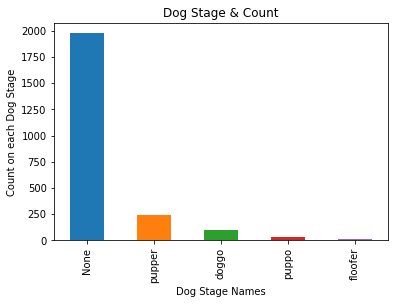

In [49]:
import matplotlib.pyplot as plt
pd.value_counts(twitter_archive_master['Dog_Stage']).plot.bar()
plt.title("Dog Stage & Count")
plt.xlabel("Dog Stage Names")
plt.ylabel("Count on each Dog Stage")
